# Classifying Mobile Phone Price Ranges 

In [251]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, sum as spark_sum
from pyspark.sql.functions import corr, col, dayofweek, min, max, mean, stddev
from pyspark.sql.types import IntegerType
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler, StringIndexer, StandardScaler, OneHotEncoder, VectorIndexer
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator, MulticlassClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
from pyspark.ml.classification import DecisionTreeClassifier, RandomForestClassifier, GBTClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

In [253]:
import os
import sys
import numpy as np
import pandas as pd
from pyspark.sql import SparkSession

os.environ['PYSPARK_PYTHON'] = sys.executable
os.environ['PYSPARK_DRIVER_PYTHON'] = sys.executable

spark = (
    SparkSession
        .builder
        .master('local[*]')
        .getOrCreate()
)

train_spark = spark.read.csv(
    'train.csv',
    sep=',', header=True
)


# Data Dictionary

In [256]:
train_spark.limit(5).show()

+-------------+----+-----------+--------+---+------+----------+-----+---------+-------+---+---------+--------+----+----+----+---------+-------+------------+----+-----------+
|battery_power|blue|clock_speed|dual_sim| fc|four_g|int_memory|m_dep|mobile_wt|n_cores| pc|px_height|px_width| ram|sc_h|sc_w|talk_time|three_g|touch_screen|wifi|price_range|
+-------------+----+-----------+--------+---+------+----------+-----+---------+-------+---+---------+--------+----+----+----+---------+-------+------------+----+-----------+
|          842|   0|        2.2|       0|  1|     0|         7|  0.6|      188|      2|  2|       20|     756|2549|   9|   7|       19|      0|           0|   1|          1|
|         1021|   1|        0.5|       1|  0|     1|        53|  0.7|      136|      3|  6|      905|    1988|2631|  17|   3|        7|      1|           1|   0|          2|
|          563|   1|        0.5|       1|  2|     1|        41|  0.9|      145|      5|  6|     1263|    1716|2603|  11|   2|     

In [258]:
train_spark.printSchema()

root
 |-- battery_power: string (nullable = true)
 |-- blue: string (nullable = true)
 |-- clock_speed: string (nullable = true)
 |-- dual_sim: string (nullable = true)
 |-- fc: string (nullable = true)
 |-- four_g: string (nullable = true)
 |-- int_memory: string (nullable = true)
 |-- m_dep: string (nullable = true)
 |-- mobile_wt: string (nullable = true)
 |-- n_cores: string (nullable = true)
 |-- pc: string (nullable = true)
 |-- px_height: string (nullable = true)
 |-- px_width: string (nullable = true)
 |-- ram: string (nullable = true)
 |-- sc_h: string (nullable = true)
 |-- sc_w: string (nullable = true)
 |-- talk_time: string (nullable = true)
 |-- three_g: string (nullable = true)
 |-- touch_screen: string (nullable = true)
 |-- wifi: string (nullable = true)
 |-- price_range: string (nullable = true)



In [260]:
columns_to_convert = ['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 
                      'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi', 'price_range']

In [262]:
for column in columns_to_convert:
    train_spark = train_spark.withColumn(column, col(column).cast(IntegerType()))

In [245]:
train_spark.printSchema()

root
 |-- features: vector (nullable = true)
 |-- price_range: integer (nullable = true)



In [50]:
missing_values = train_spark.select([spark_sum(col(c).isNull().cast("int")).alias(c) for c in train_spark.columns])
missing_values.show()

+-------------+----+-----------+--------+---+------+----------+-----+---------+-------+---+---------+--------+---+----+----+---------+-------+------------+----+-----------+
|battery_power|blue|clock_speed|dual_sim| fc|four_g|int_memory|m_dep|mobile_wt|n_cores| pc|px_height|px_width|ram|sc_h|sc_w|talk_time|three_g|touch_screen|wifi|price_range|
+-------------+----+-----------+--------+---+------+----------+-----+---------+-------+---+---------+--------+---+----+----+---------+-------+------------+----+-----------+
|            0|   0|          0|       0|  0|     0|         0|    0|        0|      0|  0|        0|       0|  0|   0|   0|        0|      0|           0|   0|          0|
+-------------+----+-----------+--------+---+------+----------+-----+---------+-------+---+---------+--------+---+----+----+---------+-------+------------+----+-----------+



# Summary Statistics

In [52]:
train_spark.summary().show(truncate=False, vertical=True)

-RECORD 0----------------------------
 summary       | count               
 battery_power | 2000                
 blue          | 2000                
 clock_speed   | 2000                
 dual_sim      | 2000                
 fc            | 2000                
 four_g        | 2000                
 int_memory    | 2000                
 m_dep         | 2000                
 mobile_wt     | 2000                
 n_cores       | 2000                
 pc            | 2000                
 px_height     | 2000                
 px_width      | 2000                
 ram           | 2000                
 sc_h          | 2000                
 sc_w          | 2000                
 talk_time     | 2000                
 three_g       | 2000                
 touch_screen  | 2000                
 wifi          | 2000                
 price_range   | 2000                
-RECORD 1----------------------------
 summary       | mean                
 battery_power | 1238.5185           
 blue       

# Plotting


In [69]:
pandas_df = train_spark.toPandas()

In [71]:
pandas_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2,0,1,0,7,0,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0,1,0,1,53,0,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0,1,2,1,41,0,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2,0,0,0,10,0,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1,0,13,1,44,0,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


# EDA

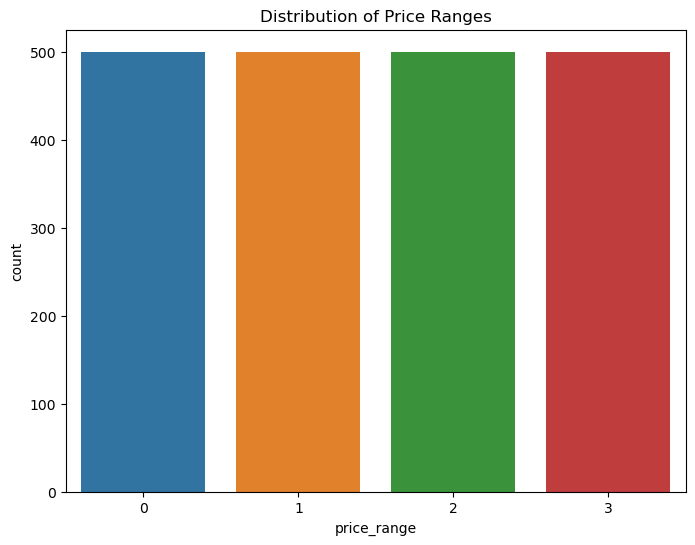

In [82]:
# Visualize the distribution of the target variable
plt.figure(figsize=(8, 6))
sns.countplot(x='price_range', data=pandas_df)
plt.title('Distribution of Price Ranges')
plt.show()


<Figure size 1500x1500 with 0 Axes>

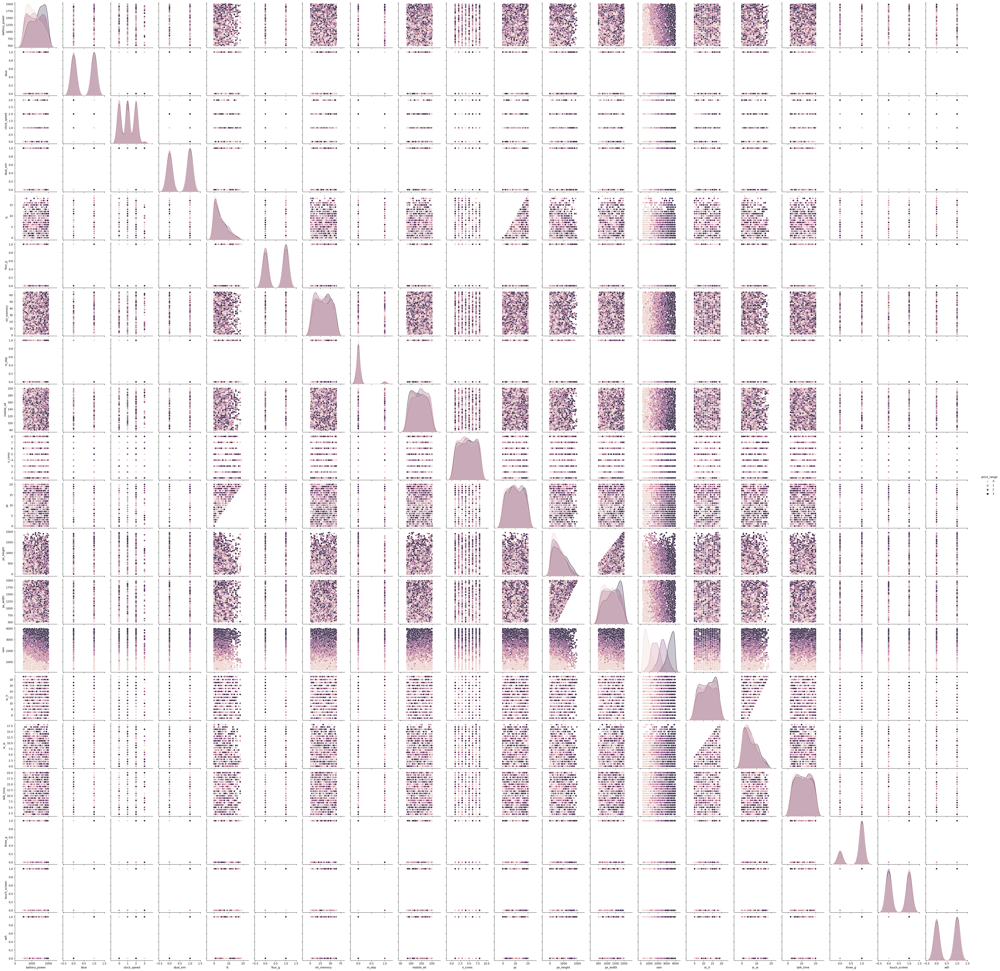

In [84]:
# Pairplot to visualize relationships between numerical features
numerical_features = pandas_df.drop('price_range', axis=1)
plt.figure(figsize=(15, 15))
sns.pairplot(pandas_df, hue='price_range', vars=numerical_features.columns)
plt.show()


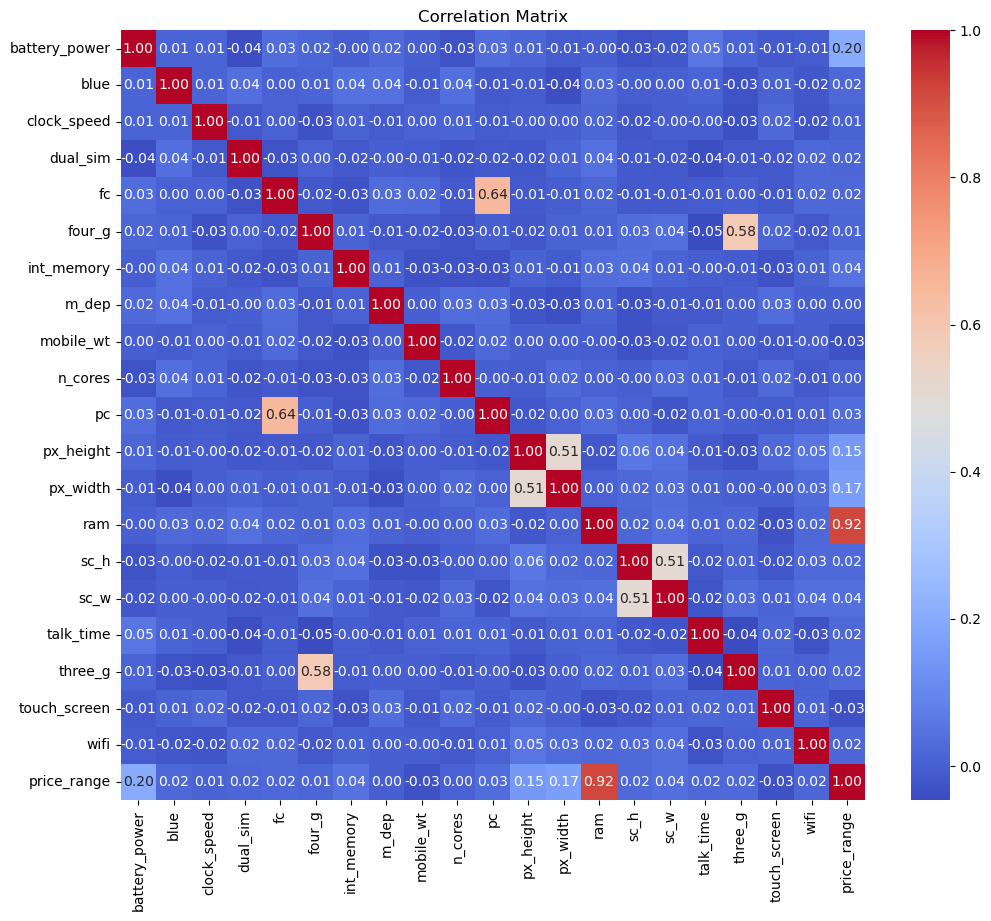

In [85]:
# Correlation matrix
correlation_matrix = pandas_df.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()


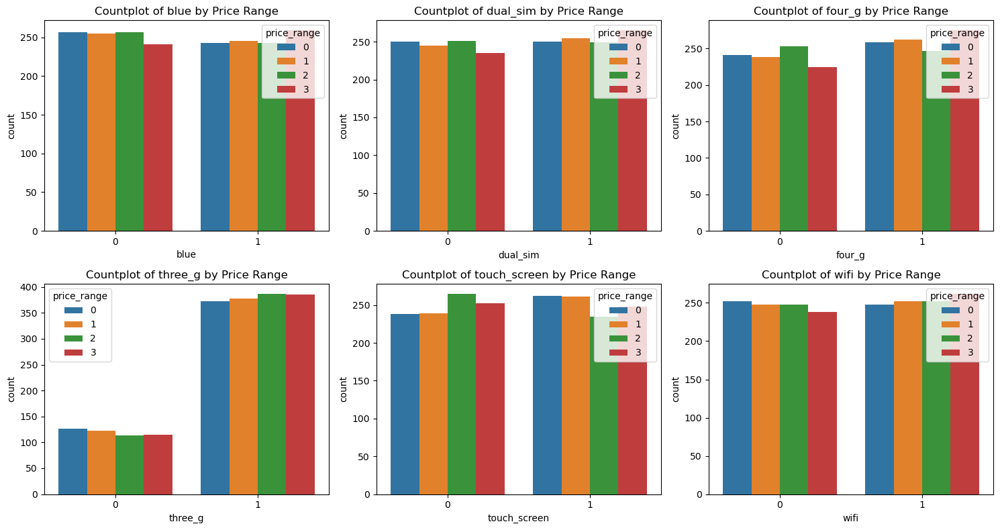

In [90]:
# Countplot for categorical features against the target variable
categorical_features = ['blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi']
plt.figure(figsize=(15, 8))
for i, col in enumerate(categorical_features, 1):
    plt.subplot(2, 3, i)
    sns.countplot(x=col, hue='price_range', data=pandas_df)
    plt.title(f'Countplot of {col} by Price Range')
plt.tight_layout()
plt.show()

# Preprocessing

In [94]:
 # Exclude the target column 'price_range'
feature_columns = train_spark.columns[:-1]  
assembler = VectorAssembler(inputCols=feature_columns, outputCol="features")
train_spark = assembler.transform(train_spark)

In [96]:
train_spark = train_spark.select("features", "price_range")

In [100]:
train_data, test_data = train_spark.randomSplit([0.8, 0.2], seed=1234)

# Decision Tree

In [147]:
dt = DecisionTreeClassifier(featuresCol='features', labelCol='price_range', maxBins=1000)
dt_trained = dt.fit(train_data)

df_predict_train = dt_trained.transform(train_data)
df_predict_test = dt_trained.transform(test_data)

In [152]:
evaluator = MulticlassClassificationEvaluator(labelCol='price_range', predictionCol='prediction', metricName='accuracy')
train_accuracy = evaluator.evaluate(df_predict_train)
test_accuracy = evaluator.evaluate(df_predict_test)

print(f"Decision Tree Test Accuracy = {test_accuracy:.2f}")
print(f"Decision Tree Train Accuracy = {train_accuracy:.2f}")

df_predict_test.select("features","price_range", "prediction").show()

Train Accuracy = 0.87
Test Accuracy = 0.79
+--------------------+-----------+----------+
|            features|price_range|prediction|
+--------------------+-----------+----------+
|(20,[0,1,2,6,8,9,...|          1|       1.0|
|(20,[0,1,6,8,9,10...|          2|       2.0|
|(20,[0,4,6,8,9,10...|          1|       1.0|
|(20,[0,4,6,8,9,10...|          2|       2.0|
|(20,[0,4,6,8,9,10...|          1|       1.0|
|(20,[0,4,6,8,9,10...|          3|       2.0|
|(20,[0,4,6,8,9,10...|          1|       1.0|
|(20,[0,6,8,9,10,1...|          0|       1.0|
|[503.0,0.0,1.0,1....|          1|       2.0|
|[503.0,1.0,1.0,1....|          3|       1.0|
|[506.0,0.0,1.0,0....|          2|       1.0|
|[508.0,0.0,1.0,1....|          2|       1.0|
|[508.0,1.0,1.0,0....|          1|       1.0|
|[509.0,1.0,0.0,1....|          0|       0.0|
|[511.0,0.0,0.0,1....|          1|       2.0|
|[512.0,1.0,0.0,1....|          2|       1.0|
|[514.0,1.0,2.0,1....|          0|       0.0|
|[516.0,0.0,1.0,1....|          0|   

# Decision Tree Hyperparameter Tuning

In [141]:
paramGrid = (ParamGridBuilder()
             .addGrid(dt.maxDepth, [5, 10, 15])
             .addGrid(dt.maxBins, [20, 32, 100])
             .build())

In [157]:
evaluator = MulticlassClassificationEvaluator(
    labelCol="price_range", predictionCol= "prediction", metricName="accuracy")

In [159]:
cv = CrossValidator(estimator=dt,
                    estimatorParamMaps=paramGrid,
                    evaluator=evaluator,
                    numFolds=5)

In [161]:
cvModel = cv.fit(train_data)

In [187]:
predictions = cvModel.transform(train_data)

In [192]:
test_accuracy = evaluator.evaluate(predictions)
print(f"Test Accuracy: {test_accuracy}")

bestModel = cvModel.bestModel
print(f"Best parameters: Max Depth = {bestModel.getMaxDepth()}, Max Bins = {bestModel.getMaxBins()}")
df_predict_test.select("price_range", "prediction").show()

Test Accuracy: 0.8709677419354839
Best parameters: Max Depth = 5, Max Bins = 1000
+-----------+----------+
|price_range|prediction|
+-----------+----------+
|          1|       1.0|
|          2|       2.0|
|          1|       1.0|
|          2|       2.0|
|          1|       1.0|
|          3|       2.0|
|          1|       1.0|
|          0|       1.0|
|          1|       2.0|
|          3|       1.0|
|          2|       1.0|
|          2|       1.0|
|          1|       1.0|
|          0|       0.0|
|          1|       2.0|
|          2|       1.0|
|          0|       0.0|
|          0|       0.0|
|          1|       1.0|
|          0|       0.0|
+-----------+----------+
only showing top 20 rows



# Random Forest

In [268]:
rf = RandomForestClassifier(featuresCol='features', labelCol='price_range', maxBins=1000)
rf_trained = rf.fit(train_data)

df_predict_train = rf_trained.transform(train_data)
df_predict_test = rf_trained.transform(test_data)

df_predict_train.select('features', 'price_range', 'prediction').show()
df_predict_test.select('features', 'price_range', 'prediction').show()

+--------------------+-----------+----------+
|            features|price_range|prediction|
+--------------------+-----------+----------+
|(20,[0,1,2,6,8,9,...|          2|       2.0|
|(20,[0,1,3,6,8,9,...|          1|       2.0|
|(20,[0,1,3,6,8,9,...|          2|       2.0|
|(20,[0,1,6,8,9,10...|          0|       0.0|
|(20,[0,1,6,8,9,11...|          2|       2.0|
|(20,[0,2,3,6,8,9,...|          3|       3.0|
|(20,[0,2,3,6,8,9,...|          0|       0.0|
|(20,[0,2,6,8,9,10...|          2|       2.0|
|(20,[0,2,6,8,9,10...|          1|       1.0|
|(20,[0,2,6,8,9,10...|          1|       0.0|
|(20,[0,2,6,8,9,10...|          3|       3.0|
|(20,[0,2,6,8,9,10...|          2|       2.0|
|(20,[0,2,6,8,9,10...|          2|       2.0|
|(20,[0,2,6,8,9,10...|          2|       2.0|
|(20,[0,2,6,8,9,11...|          3|       3.0|
|(20,[0,2,6,8,9,11...|          1|       1.0|
|(20,[0,2,6,8,9,11...|          0|       0.0|
|(20,[0,2,6,8,9,11...|          3|       3.0|
|(20,[0,3,4,6,8,9,...|          1|

In [270]:
evaluator = MulticlassClassificationEvaluator(labelCol='price_range', predictionCol='prediction', metricName='accuracy')
accuracy_train = evaluator.evaluate(df_predict_train)
accuracy_test = evaluator.evaluate(df_predict_test)

print(f'Training Accuracy: {accuracy_train}')
print(f'Test Accuracy: {accuracy_test}')

Training Accuracy: 0.8976426799007444
Test Accuracy: 0.7989690721649485


In [272]:
pd_predict_train = df_predict_train.select(col('price_range').alias('label'), col('prediction')).toPandas()
pd_predict_test = df_predict_test.select(col('price_range').alias('label'), col('prediction')).toPandas()

def compute_metrics(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    
    return cm, accuracy, precision, recall, f1

cm_train, accuracy_train, precision_train, recall_train, f1_score_train = compute_metrics(pd_predict_train['label'], pd_predict_train['prediction'])
print(f'Training Confusion Matrix:\n{cm_train}')
print(f'Training Accuracy: {accuracy_train}')
print(f'Training Precision: {precision_train}')
print(f'Training Recall: {recall_train}')
print(f'Training F1 Score: {f1_score_train}')

cm_test, accuracy_test, precision_test, recall_test, f1_score_test = compute_metrics(pd_predict_test['label'], pd_predict_test['prediction'])
print(f'Test Confusion Matrix:\n{cm_test}')
print(f'Test Accuracy: {accuracy_test}')
print(f'Test Precision: {precision_test}')
print(f'Test Recall: {recall_test}')
print(f'Test F1 Score: {f1_score_test}')

Training Confusion Matrix:
[[398  18   0   0]
 [ 28 338  37   0]
 [  0  46 324  21]
 [  0   0  15 387]]
Training Accuracy: 0.8976426799007444
Training Precision: 0.8968563451982079
Training Recall: 0.8976426799007444
Training F1 Score: 0.8971232901634875
Test Confusion Matrix:
[[77  7  0  0]
 [ 8 78 11  0]
 [ 0 24 67 18]
 [ 0  0 10 88]]
Test Accuracy: 0.7989690721649485
Test Precision: 0.798593011890284
Test Recall: 0.7989690721649485
Test F1 Score: 0.795597528261276
